In [1]:
import os
import glob
import cv2
import geopandas as gpd
import h5py # just a safety check so the checkpoint callback doesnt crash
import matplotlib.pyplot as plt
import numpy as np
import rasterio
from scipy.misc import imresize
from scipy import *
import shapely.geometry
import tensorflow as tf
print(tf.__version__)
import pandas as pd
from geopandas import GeoDataFrame
import math
import warnings
from math import floor
warnings.filterwarnings('ignore')

from keras.models import Sequential
from keras.layers import Dense
from keras.models import model_from_json
import numpy
import os

import scipy
from scipy import ndimage



%matplotlib inline

1.1.0


Using TensorFlow backend.


In [2]:
from keras import backend as K
K.clear_session()

In [3]:
#INPUT_SIZE = 480

def get_image_set_list(path_img, image_path, path_geojson):
    image_list = []
    masks = []
    images = []
    geojson_files = []
    for filename in glob.glob(path_img):
        base_name = str(filename)
        base_name = base_name.split('_mask.npy')
        base_name = base_name[0].split('_Masks/')
        image_base = base_name[1]
        image_name = image_path + base_name[1] + '.tif'
        image_list.append(image_base)
        masks.append(filename)
        images.append(image_name) 
    
    mask_df = pd.DataFrame({'names': image_list, 'masks': masks,'image_file':images })
    
    image_list = []
    for filename in glob.glob(path_geojson):
        #geojasons = str(filename)
        base_name = str(filename)
        base_name = base_name.split('.geojson')
        base_name = base_name[0].split('_panel')
        base_name = base_name[0].split('_Masks/')
        image_base = base_name[1]
        image_name = image_path + base_name[1] + '.tif'
        image_list.append(image_name)
        geojson_files.append(filename)
    geojson_df = pd.DataFrame({'geojson_files':geojson_files,'image_file':image_list})
    

    return mask_df, geojson_df, len(mask_df), len(geojson_df)

def make_panel_vector(mask_df,geojson_df):
    print(len(geojson_df))
    polygons = []
    filenames = []
    for i in range(0,len(geojson_df)):
        try: 
            filename = geojson_df.geojson_files[i]
            image_polygons = gpd.read_file(filename) 
            image_polygons_list = []
            for i in range(len(image_polygons)):
                image_polygons_list.append(image_polygons['geometry'].iloc[i])
            file_list = np.repeat(filename, len(image_polygons_list))
            polygons.extend(image_polygons_list)
            filenames.extend(file_list)     

        except:
            print("couldn't read file")

    print("There are", len(polygons), " panels in the dataset", len(filenames))
    df_vectors = pd.DataFrame({'geometry':polygons,'file':filenames})
    panel_df = GeoDataFrame(df_vectors)
    panels = panel_df.unary_union
    vectors = [panels]
    return df_vectors, panel_df, panels, vectors

def make_building_vector(df_vectors, building_image_summary):
    panel_image_names= []
    for image in range(0,len(df_vectors)):
        image_name = df_vectors.geojson_files[image].split('pen_')[1].split('.geo')[0]
        panel_image_names.append(image_name)
        
    df_panel_buildings = building_image_summary[building_image_summary['ImageId'].isin(panel_image_names)]
    buildings_footprint = building_footprints.unary_union
    buildings_vectors = [buildings_footprint]
    
    return df_panel_buildings, buildings_footprint, buildings_vectors
    
# Recycle a couple of functions from previous notebooks...
def polycoords(poly):
    """Convert a polygon into the format expected by OpenCV
    """
    if poly.type in ['MultiPolygon', 'GeometryCollection']:
        return [np.array(p.exterior.coords) for p in poly if p.type == 'Polygon']
    elif poly.type == 'Polygon':
        return [np.array(poly.exterior.coords)]
    else:
        print('Encountered unrecognized geometry type {}. Ignoring.'.format(poly.type))
        return []

def make_mask(img_shape, poly):
    """Make a mask from a polygon"""
    poly_pts = polycoords(poly)
    polys = [x.astype(int) for x in poly_pts]
    # Create an empty mask and then fill in the polygons
    mask = np.zeros(img_shape[:2])
    cv2.fillPoly(mask, polys, 255)
    return mask.astype('uint8')

def scale_bands(img, lower_pct = 1, upper_pct = 99):
    """Rescale the bands of a multichannel image for display"""
    img_scaled = np.zeros(img.shape, np.uint8)
    for i in range(img.shape[2]):
        band = img[:, :, i]
        lower, upper = np.percentile(band, [lower_pct, upper_pct])
        band = (band - lower) / (upper - lower) * 255
        img_scaled[:, :, i] = np.clip(band, 0, 255).astype(np.uint8)
    return img_scaled

def resize(img, new_shape):
    img_resized = np.zeros(new_shape+(img.shape[2],)).astype('float32')
    for i in range(img.shape[2]):
        img_resized[:, :, i] = imresize(img[:, :, i], new_shape, interp='bicubic')
    return img_resized

import pyproj
def reproject_shapely(proj_init, proj_targ, poly):
    project = functools.partial(
        pyproj.transform,
        pyproj.Proj(proj_init),
        pyproj.Proj(proj_targ)
    )
    return shapely.ops.transform(project, poly)



# Build a training set
def make_set(panel_image_summary, panel_vectors, building_image_summary, building_vectors):
    X = []
    Y_panel = []
    Y_building = []
    n=0
    for i, row in panel_image_summary.iterrows():
        try:
            #print(row)
            #print(i)
                #Make the panel ground truth
            #print(row.image_file)
            #imagename = row.file.split('pen_')[1].split('.geo')[0].split('_pan')[0]
            #filename = '/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/MUL-PanSharpen/MUL-PanSharpen_' + imagename + ".tif"
            with rasterio.open(row.image_file) as src:
                    img = src.read().transpose([1,2,0])
                    original_shape = img.shape[:2]
                    img = resize(img, (input_size, input_size))
                    # img = scale_bands(img, lower_pct = 5, upper_pct = 95)
                    img_bounds = shapely.geometry.box(*src.bounds)
                    img_transform = list(np.array(~src.transform)[[0, 1, 3, 4, 2, 5]])
                    #img_transform = list(np.array(~src.affine)[[0, 1, 3, 4, 2, 5]])
                    img_crs = src.crs

            building_masks = []
            for poly in building_vectors:
                # If the image is not projected in epsg:4326, we will need to change the polygon to match the image
                if not img_crs == {'init': 'epsg:4326'}:
                    poly = reproject_shapely({'init': 'epsg:4326'}, img_crs, poly)

                # Get the intersection between the polygon and the image bounds
                mask_poly = poly.intersection(img_bounds)

                # Transform it into pixel coordinates
                mask_poly_pxcoords = shapely.affinity.affine_transform(mask_poly, img_transform)

                # Convert the polygon into a mask
                mask = make_mask(original_shape, mask_poly_pxcoords)
                mask = imresize(mask, (input_size, input_size))

                building_masks.append(mask[..., None])

            building_masks = np.concatenate(building_masks, axis=2)

            panel_masks = []
            for poly in panel_vectors:
                # If the image is not projected in epsg:4326, we will need to change the polygon to match the image
                if not img_crs == {'init': 'epsg:4326'}:
                    poly = reproject_shapely({'init': 'epsg:4326'}, img_crs, poly)

                # Get the intersection between the polygon and the image bounds
                mask_poly = poly.intersection(img_bounds)

                # Transform it into pixel coordinates
                mask_poly_pxcoords = shapely.affinity.affine_transform(mask_poly, img_transform)

                # Convert the polygon into a mask
                mask = make_mask(original_shape, mask_poly_pxcoords)
                mask = imresize(mask, (input_size, input_size))

                panel_masks.append(mask[..., None])

            panel_masks = np.concatenate(panel_masks, axis=2)

            #print(n)
            # Add each mask to a list
            X.append(img[None, ...]) # These need to be truncated for U-Net
            Y_panel.append(panel_masks[None, ...])
            Y_building.append(building_masks[None, ...])

        except:
            print('could not use image',i)

        if n%50 == 0:
            print("Making mask for train image:", n)
        else:
            continue    
        n=n+1 
        
    # Concatenate the results
    X = np.concatenate(X, axis=0)
    Y_panel = np.concatenate(Y_panel, axis=0)
    Y_building = np.concatenate(Y_building, axis=0)
    
    # Normalize the values
    X = X.astype('float32')
    X = (X / X.max() - 0.5) * 2 # put X in range [-1, 1]
    Y_panel = Y_panel.astype('float32') / 255 # put Y in range [0, 1]
    Y_building = Y_building.astype('float32') / 255 # put Y in range [0, 1]
    #print(X_train.shape)

    
    return X, Y_panel, Y_building


def add_building_footprint(X):
    X_new = []
   # check = 0
    for image in X:
        new_image = make_building_channel(model, image)
        X_new.append(new_image[None, ...])
    X_new = np.concatenate(X_new, axis=0)
    #print("new train shape", X_train_new.shape)
    #print(check)
    return X_new

def make_pascal_set(data_list_path, data_path, training_set_size, input_size, random=np.random):
    pass


def import_building_model(model_json, weights_file):
    # load json and create model
    json_file = open(model_json, 'r')
    loaded_model_json = json_file.read()
    #print(loaded_model_json)
    json_file.close()
    model = model_from_json(loaded_model_json)
    # load weights into new model
    model.load_weights(weights_file)
    print("Loaded model from disk") 
    
    return(model)
    
def make_building_channel(model, X):
    Pred_test = model.predict(X[None, ...])[0, ...]> 0.15
    building_mask = Pred_test[:,:,0]
    building_mask = (((building_mask / building_mask.max())*2)-1)
    #print(X.shape)
    #print(Pred_test.shape)
    #X_new = np.concatenate([X,building_mask],axis=2)
    X_new = np.dstack([X,building_mask])
   
    #print(X_new.shape)
    return X_new

def make_rotated_copies(X,Y):
    rotated_list_X = []
    #rotated_list_X.append(X)
    rotated_list_Y = []
    #rotated_list_Y.append(Y)
    for deg in [180]:
        X_rotated = ndimage.rotate(X, deg)
        rotated_list_X.append(X_rotated[None, ...])
        Y_rotated = ndimage.rotate(Y, deg)
        rotated_list_Y.append(Y_rotated[None, ...])
    return rotated_list_X, rotated_list_Y

def make_mirror_images(X,Y):
    mirror_list_X = []
    mirror_list_Y = []
    X_flipped_lr = np.fliplr(X)
    mirror_list_X.append(X_flipped_lr[None, ...])
    Y_flipped_lr = np.fliplr(Y)
    mirror_list_Y.append(Y_flipped_lr[None, ...])
    #X_flipped_ud = np.flipud(X)
    #mirror_list_X.append(X_flipped_ud[None, ...])
    #Y_flipped_ud = np.flipud(Y)
    #mirror_list_Y.append(Y_flipped_ud[None, ...])

    return mirror_list_X, mirror_list_Y

def subset_test_image(X,Y_panels, Y_buildings, array_number):
    split_num = sqrt(array_number)
    
    #X_arrays
    new_X_arrays = []
    X_1,X_2 =  np.array_split(X,split_num,axis=1)    
    X_1a, X_1b = np.array_split(X_1,split_num,axis=0)
    new_X_arrays.append(X_1a[None, ...])
    new_X_arrays.append(X_1b[None, ...])
    X_2a, X_2b = np.array_split(X_2,split_num,axis=0)
    new_X_arrays.append(X_2a[None, ...])
    new_X_arrays.append(X_2b[None, ...])
    
    new_X_arrays_large = []
    for piece in new_X_arrays:
        #print(piece[0,:,:,:].shape)
        new_piece = piece[0,:,:,:]
        #print(piece.shape[1])
        size = new_piece.shape[1]
        larger_piece = resize(new_piece, (2*size, 2*size))
        larger_piece = larger_piece/size
        new_X_arrays_large.append(larger_piece[None, ...])
 
    #Pred_arrays
    #Panels
    new_Y_panels_arrays = []
    Y_panels_1,Y_panels_2 =  np.array_split(Y_panels,split_num,axis=1)    
    Y_panels_1a, Y_panels_1b = np.array_split(Y_panels_1,split_num,axis=0)
    new_Y_panels_arrays.append(Y_panels_1a[None, ...])
    new_Y_panels_arrays.append(Y_panels_1b[None, ...])
    Y_panels_2a, Y_panels_2b = np.array_split(Y_panels_2,split_num,axis=0)
    new_Y_panels_arrays.append(Y_panels_2a[None, ...])
    new_Y_panels_arrays.append(Y_panels_2b[None, ...])
    
    new_Y_panels_arrays_large = []
    for piece in new_Y_panels_arrays:
        #print(piece[0,:,:,:].shape)
        new_piece = piece[0,:,:,:]
        #print(piece.shape[1])
        size = new_piece.shape[1]
        larger_piece = resize(new_piece, (2*size, 2*size))
        new_Y_panels_arrays_large.append(larger_piece[None, ...])
    
    #Buildings    
    new_Y_buildings_arrays = []
    Y_buildings_1,Y_buildings_2 =  np.array_split(Y_buildings,split_num,axis=1)    
    Y_buildings_1a, Y_buildings_1b = np.array_split(Y_buildings_1,split_num,axis=0)
    new_Y_buildings_arrays.append(Y_buildings_1a[None, ...])
    new_Y_buildings_arrays.append(Y_buildings_1b[None, ...])
    Y_buildings_2a, Y_buildings_2b = np.array_split(Y_buildings_2,split_num,axis=0)
    new_Y_buildings_arrays.append(Y_buildings_2a[None, ...])
    new_Y_buildings_arrays.append(Y_buildings_2b[None, ...])
    
    new_Y_buildings_arrays_large = []
    for piece in new_Y_buildings_arrays:
        #print(piece[0,:,:,:].shape)
        new_piece = piece[0,:,:,:]
        #print(piece.shape[1])
        size = new_piece.shape[1]
        larger_piece = resize(new_piece, (2*size, 2*size))
        new_Y_buildings_arrays_large.append(larger_piece[None, ...])    
        
    new_X_arrays_large = np.concatenate(new_X_arrays_large, axis=0)
    new_Y_panels_arrays_large = np.concatenate(new_Y_panels_arrays_large, axis=0)
    new_Y_buildings_arrays_large = np.concatenate(new_Y_buildings_arrays_large, axis=0)
        
    return new_X_arrays_large, new_Y_panels_arrays_large, new_Y_buildings_arrays_large

def subset_and_resize_image(X,Y,array_number):
    split_num = sqrt(array_number)
    
    #X_arrays
    new_X_arrays = []
    X_1,X_2 =  np.array_split(X,split_num,axis=1)    
    X_1a, X_1b = np.array_split(X_1,split_num,axis=0)
    new_X_arrays.append(X_1a[None, ...])
    new_X_arrays.append(X_1b[None, ...])
    X_2a, X_2b = np.array_split(X_2,split_num,axis=0)
    new_X_arrays.append(X_2a[None, ...])
    new_X_arrays.append(X_2b[None, ...])
    
    new_X_arrays_large = []
    for piece in new_X_arrays:
        #print(piece[0,:,:,:].shape)
        new_piece = piece[0,:,:,:]
        #print(piece.shape[1])
        size = new_piece.shape[1]
        larger_piece = resize(new_piece, (2*size, 2*size))
        larger_piece = larger_piece/size
        new_X_arrays_large.append(larger_piece[None, ...])
      
    # Normalize the values
    #new_X_arrays_large = new_X_arrays_large.astype('float32')
    #new_X_arrays_large = [x / new_X_arrays_large[x].max() for x in new_X_arrays_large]
    #new_X_arrays_large = (new_X_arrays_large / new_X_arrays_large.max() - 0.5) * 2 # put X in range [-1, 1]
    #print(X_train.shape)


    
    
    #Pred_arrays
    new_Y_arrays = []
    Y_1,Y_2 =  np.array_split(Y,split_num,axis=1)    
    Y_1a, Y_1b = np.array_split(Y_1,split_num,axis=0)
    new_Y_arrays.append(Y_1a[None, ...])
    new_Y_arrays.append(Y_1b[None, ...])
    Y_2a, Y_2b = np.array_split(Y_2,split_num,axis=0)
    new_Y_arrays.append(Y_2a[None, ...])
    new_Y_arrays.append(Y_2b[None, ...])
    
    new_Y_arrays_large = []
    for piece in new_Y_arrays:
        #print(piece[0,:,:,:].shape)
        new_piece = piece[0,:,:,:]
        #print(piece.shape[1])
        size = new_piece.shape[1]
        larger_piece = resize(new_piece, (2*size, 2*size))
        new_Y_arrays_large.append(larger_piece[None, ...])
    return new_X_arrays, new_X_arrays_large, new_Y_arrays, new_Y_arrays_large

def augment_set(X_train, Y_train, X_val, Y_val):
    print("starting!")
    X_train_augmented = []
    Y_train_augmented = []
    #i = len(X_train)
    counter = 0
    print("Making train set")
#     print("X", X_train.shape[0])
    for i in range(X_train.shape[0]):
#         print(i)
#         print("initial")
#         print("X", X_train[i].shape)
#         print("Y",Y_train[i].shape)
#         for ch in range(9):
#             print("X",X_train[i][:,:,ch].max(),X_train[i][:,:,ch].min(), ch)
#         print("Y", Y_train[i][:,:,0].max(),Y_train[i][:,:,0].min(), ch)
        X_train_augmented.append(X_train[i][None, ...])
        Y_train_augmented.append(Y_train[i][None, ...])
        rotated_list_X, rotated_list_Y = make_rotated_copies(X_train[i],Y_train[i])
#         print("rotated")
#         for ch in range(9):
#             print("X",rotated_list_X[i][:,:,ch].max(), rotated_list_X[i][:,:,ch].min(), rotated_list_X[i].shape,  ch)
#             print("Y",rotated_list_Y[i][:,:,ch].max(), rotated_list_Y[i][:,:,ch].min(), rotated_list_Y[i].shape, ch)
        X_train_augmented = X_train_augmented + rotated_list_X
        #X_train_augmented.append(rotated_list_X)
        #print(rotated_list_X[1].shape)
        Y_train_augmented = Y_train_augmented+ rotated_list_Y
        
#         print(len(X_train_augmented ))
#         print(len(Y_train_augmented ))
        
        #print(rotated_list_Y[1].shape)
        #print("Rotated")
        mirror_list_X, mirror_list_Y = make_mirror_images(X_train[i],Y_train[i])
#         print("mirrored")
#         for ch in range(9):
#             print("X",mirror_list_X[i][:,:,ch].max(), mirror_list_X[i][:,:,ch].min(), mirror_list_X[i].shape, ch)
#             print("Y",mirror_list_Y[i][:,:,ch].max(), mirror_list_Y[i][:,:,ch].min(), mirror_list_X[i].shape, ch)
        X_train_augmented = X_train_augmented + mirror_list_X
        #print(mirror_list_X[1].shape)
        Y_train_augmented = Y_train_augmented + mirror_list_Y
        #print(mirror_list_Y[1].shape)
        #print("Mirrored")
#         print(len(X_train_augmented ))
#         print(len(Y_train_augmented ))
        
        new_X_arrays, new_X_arrays_large, new_Y_arrays, new_Y_arrays_large = subset_and_resize_image(X_train[i],Y_train[i],4)
#         print("larged")
#         for ch in range(9):
#             print("X",new_X_arrays_large[i][:,:,ch].max(),new_X_arrays_large[i][:,:,ch].min(), new_X_arrays_large[i].shape, ch)
#             print("Y", new_Y_arrays_large[i][:,:,ch].max(), new_Y_arrays_large[i][:,:,ch].min(),new_Y_arrays_large[i].shape, ch)
        X_train_augmented = X_train_augmented + new_X_arrays_large
        #X_train_augmented.append(new_X_arrays)
        Y_train_augmented = Y_train_augmented + new_Y_arrays_large
        #Y_train_augmented.append(new_Y_arrays)
        #print("resized")
        
#         print(len(X_train_augmented ))
#         print(len(Y_train_augmented ))
        
        counter = counter+1
        if counter%10== 0:
            print(counter)
        else:
            continue
#     print(len(X_train_augmented))
  
    X_train_augmented = np.concatenate(X_train_augmented, axis=0)
    Y_train_augmented = np.concatenate(Y_train_augmented, axis=0)
    
    print("Making test set")
    X_val_augmented = []
    Y_val_augmented = []
    counter = 0
    for i in range(X_val.shape[0]):
        X_val_augmented.append(X_val[i][None, ...])
        Y_val_augmented.append(Y_val[i][None, ...])
        rotated_list_X, rotated_list_Y = make_rotated_copies(X_val[i],Y_val[i])
        X_val_augmented = X_val_augmented + rotated_list_X
        Y_val_augmented = Y_val_augmented + rotated_list_Y
        #print("Rotated")
#         print(len(X_val_augmented ))
#         print(len(Y_val_augmented ))
        
        
        mirror_list_X, mirror_list_Y = make_mirror_images(X_val[i],Y_val[i])
        X_val_augmented = X_val_augmented + mirror_list_X
        Y_val_augmented = Y_val_augmented + mirror_list_Y
        #print("Mirrored")
                
#         print(len(X_val_augmented ))
#         print(len(Y_val_augmented ))
        
        new_X_arrays, new_X_arrays_large, new_Y_arrays, new_Y_arrays_large = subset_and_resize_image(X_val[i],Y_val[i],4)
        X_val_augmented = X_val_augmented + new_X_arrays_large
        #X_test_augmented.append(new_X_arrays)
        Y_val_augmented = Y_val_augmented + new_Y_arrays_large
        #Y_test_augmented.append(new_Y_arrays)
        counter = counter+1
        #print("resized")
                
#         print(len(X_val_augmented ))
#         print(len(Y_val_augmented ))
        
        
        if counter%10== 0:
            print(counter)
        else:
            continue
    
    X_val_augmented = np.concatenate(X_val_augmented, axis=0)
    Y_val_augmented = np.concatenate(Y_val_augmented, axis=0)
    
    
    return X_train_augmented,Y_train_augmented, X_val_augmented, Y_val_augmented 
    #repeat for test set
    
def keep_channels(X_train, Y_train, X_val, Y_val, channels):
    X_train = X_train[:,:,:,channel_list]
    Y_train =  Y_train
    X_val =X_val[:,:,:,channel_list]
    Y_val =Y_val
    
    return X_train, Y_train, X_val, Y_val

# Function to create an iterator with examples
def get_examples(n):
    for i in range(Y_val.shape[0]):
        #print(i)
        if Y_val[i, ...].sum() > 0.5:
            X = X_val[i]
            #print(X)
            Y = Y_val[i]
            print(Y_val[i].shape)
            print(X_val[i].shape)
            yield X, Y

# Function to plot a single example
def plot_example(n, model, X, Y):
    # Apply the model to this example
    prediction = model.predict(X[n][None, ...])[0, ...] > 0.15
    #print(prediction)
    
    X_plot = scale_bands(X[n][:, :, [2,6,7]])
    Y = Y_building[n]
    fig, axes = plt.subplots(1,3, figsize=(15,15))
    tno = 0
    # Iterate through each target class
    #for tno in range(1):
        
    targ = Y[:, :, tno]
    pred = prediction[:, :, tno]

    ax1, ax2, ax3 = axes
    ax1.imshow(X_plot) # This index starts at 0, so I had to decrement

    #ax1.imshow(scale_bands(X[:, :, [4,2,1]])) # This index starts at 0, so I had to decrement
    ax2.imshow(targ, vmin=0, vmax=1)
    ax3.imshow(pred, vmin=0, vmax=1)

    ax1.set_title('Image')
    ax2.set_title('Ground Truth')
    ax3.set_title('Prediction')
    plt.show()

In [4]:
def scale_bands(img, lower_pct = 1, upper_pct = 99):
    """Rescale the bands of a multichannel image for display"""
    img_scaled = np.zeros(img.shape, np.uint8)
    for i in range(img.shape[2]):
        band = img[:, :, i]
        lower, upper = np.percentile(band, [lower_pct, upper_pct])
        band = (band - lower) / (upper - lower) * 255
        img_scaled[:, :, i] = np.clip(band, 0, 255).astype(np.uint8)
    
    #ax.imshow(scale_bands(img))
    return img_scaled

Load in Train and test test sets from the model:

In [14]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 
input_size = 480
path_img ='/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/Panel_Masks/*.npy'
image_path = '/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/MUL-PanSharpen/'
mask_path = '/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/Panel_Masks/'
path_geojson ='/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/Panel_Masks/*.geojson'

building_footprints = gpd.read_file('/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/building_fooprints_f.geojson')
print(len(building_footprints))
building_footprints["buffered_geometry"] = building_footprints["geometry"].buffer(0)
building_footprints = building_footprints.drop("geometry", axis = 1)
building_footprints = building_footprints.rename(columns = {'buffered_geometry':'geometry'})
# nulls = building_footprints_i[building_footprints_i.geometry == []]
# nulls
#building_footprints= building_footprints_i.copy()

#mask_df, geojson_df = get_image_set_list(path_img,path_geojson)
mask_df, geojson_df, num_masks, num_images_with_solarpanels = get_image_set_list(path_img,image_path,path_geojson)
print("There are", num_images_with_solarpanels," images with solar panels in the dataset")
print ("There are", num_masks, "images with no solar panels in the dataset")

test_df = geojson_df.sample(173, axis = 0, random_state = 2).reset_index()
print("Your dataset will contain", len(test_df)," images for training and testing")

df_panel_vectors, panel_df, panels_footprint_df, panel_vectors = make_panel_vector(mask_df, geojson_df)

df_panel_buildings, buildings_footprint_df, buildings_vectors = make_building_vector(test_df, building_footprints)  

#X, Y_panel, Y_building =  make_set(df_panel_vectors, panel_vectors, df_panel_buildings, buildings_vectors)
#random = np.random.RandomState(2) 
#X_train, Y_train, X_val, Y_val, train_length, test_length = make_set(test_df, vectors, 0.7, input_size, random=np.random)
#X_val, Y_val = make_set(test_df, vectors, 16 , input_size, random)

109807
('There are', 173, ' images with solar panels in the dataset')
('There are', 418, 'images with no solar panels in the dataset')
('Your dataset will contain', 173, ' images for training and testing')
173
couldn't read file
('There are', 766, ' panels in the dataset', 766)


In [15]:
test_df.head()

,index,geojson_files,image_file
0,12,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...
1,23,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...
2,42,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...
3,25,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...
4,112,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...


In [16]:
X, Y_panel, Y_building =  make_set(test_df, panel_vectors, df_panel_buildings, buildings_vectors)
#random = np.random.RandomState(2) 
#X_train, Y_train, X_val, Y_val, train_length, test_length = make_set(test_df, vectors, 0.7, input_size, random=np.random)
#X_val, Y_val = make_set(test_df, vectors, 16 , input_size, random)

('Making mask for train image:', 0)


TopologyException: Input geom 0 is invalid: Self-intersection at or near point -115.20886674682303 36.231240955838238 at -115.20886674682303 36.231240955838238
Self-intersection at or near point -115.20886674682303 36.231240955838238


('could not use image', 35)


In [19]:
Y_building.shape

(172, 480, 480, 1)

In [20]:
np.save('Panel_Images_for_Presentation_X_619newdata.npy',X)
np.save('Panel_Images_for_Presentation_Y_619newdata_panel.npy', Y_panel)
np.save('Panel_Images_for_Presentation_Y_619newdata_building.npy', Y_building)


In [6]:
X = np.load('Panel_Images_for_Presentation_X_619newdata.npy')
Y_panel = np.load('Panel_Images_for_Presentation_Y_619newdata_panel.npy')
Y_building = np.load('Panel_Images_for_Presentation_Y_619newdata_building.npy')


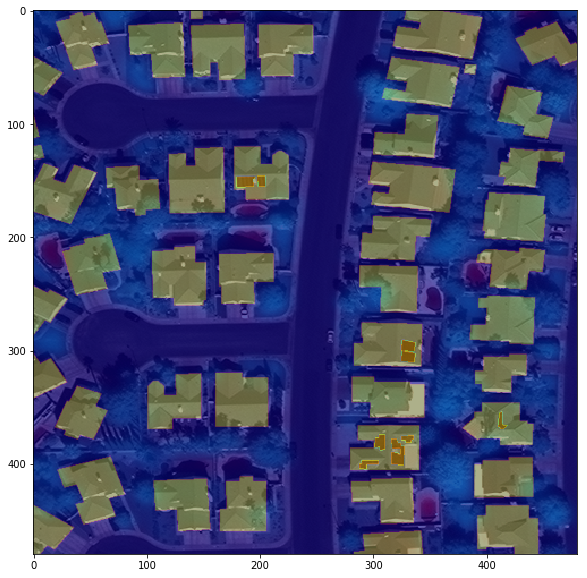

In [251]:
n= 40
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(scale_bands(X[n][:, :, [2,6,7]]))
build = Y_building[n][:, :, 0]
panel = Y_panel[n][:, :, 0]
ax.imshow(build, cmap='plasma', alpha=0.5)
ax.imshow(panel, cmap='jet', alpha=0.3)

Loaded model from disk
('building fraction = ', 0.21253038194444446)
('panel fraction = ', 0.0014453125)
('total predicted', 78793)
('total actual', 72811.0)
('Precision =', 0.88087774294670851)
('fraction of building footprints that were not predicted = ', 0.029968158831241806)
('Frac of prediction that lies outside of building footprint =', 0.11912225705329153)


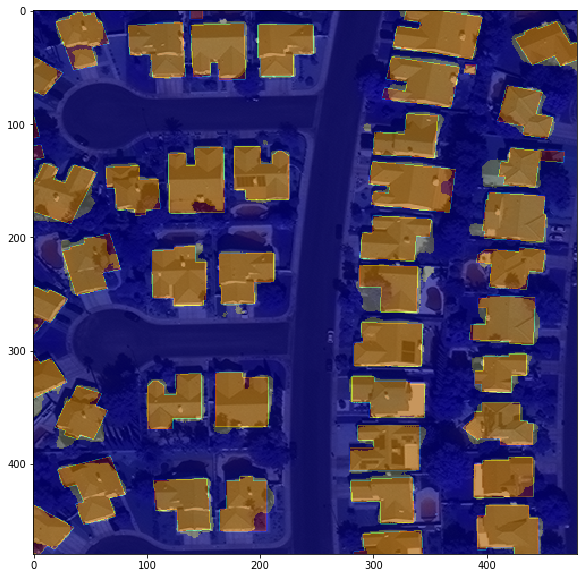

In [262]:
# load json and create model
json_file = open('/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_480_check.json', 'r')
loaded_model_json = json_file.read()
#print(loaded_model_json)
json_file.close()
model = model_from_json(loaded_model_json)
# load weights into new model
model.load_weights("/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_480_check.h5")
print("Loaded model from disk")

def plot_example(n, model, X, Y):
    prediction = model.predict(X[n][None, ...])[0, ...] > 0.3
    #print(prediction.shape)
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(scale_bands(X[n][:, :, [2,3,5]]))
    targ = Y[n][:, :, 0]
    ax.imshow(prediction[:,:,0], cmap='plasma', alpha=0.45)
    ax.imshow(targ, cmap='jet', alpha=0.4)
    precision_calc(prediction, Y[n])
    unpredicted_footprint(prediction, Y[n])
    outside_footprint(prediction, Y[n])
    
    
def precision_calc(prediction, ground_truth):
    predicted = np.round((prediction[:,:,0]/prediction[:,:,0].max()) + 0.49)
    #print("pred values", unique(prediction), "total", prediction.sum())
    print("total predicted", prediction.sum())
    actual = np.round(ground_truth[:,:,0]/ground_truth[:,:,0].max())
    #print("actual values",  unique(actual), "total", actual.sum() )
    #print(predicted.shape, actual.shape)
    print( "total actual", actual.sum() )
    intersection_array = np.multiply(actual, predicted)#, axis=[0, -1, -2])
    #print("intersection values", unique(intersection_array), intersection_array.shape)
    intersection = intersection_array.sum()
    #print("intersection = ", intersection_array.sum())
    #print(predicted.shape, intersection_array.shape)
    false_pos_array = np.subtract(predicted, intersection_array)#, axis=[0, -1, -2])
    #print("false pos values",  unique(false_pos_array.shape), "total", false_pos_array.sum() )
    false_pos = false_pos_array.sum()
    #print("false pos = ", false_pos)
    #intersection = K.sum(y_true * y_pred, axis=[0, -1, -2])
    #sum_ = K.sum(y_true + y_pred, axis=[0, -1, -2])
    #jac = (intersection + smooth) / (sum_ - intersection + smooth)
    print("Precision =", intersection/(intersection+false_pos))
    return intersection/(intersection+false_pos), intersection, false_pos
    #Y_train_augmented = np.round(Y_train_augmented + 0.49)

def unpredicted_footprint(prediction, ground_truth):
    predicted = np.round((prediction[:,:,0]/(prediction[:,:,0].max())) + 0.49)
    actual = np.round(ground_truth[:,:,0]/ground_truth[:,:,0].max())
    intersection_array = np.multiply(actual, predicted)#, axis=[0, -1, -2])
    intersection = intersection_array.sum()
    predicted = np.round(prediction[:,:,0] + 0.49)
    actual = np.round(ground_truth[:,:,0])
    dimension = prediction.shape[0]
    FN = np.zeros((dimension,dimension))
    for i in range(prediction.shape[0]):
        for j in range(prediction.shape[1]):
            if ground_truth[i,j] == 1 and prediction[i,j] == 1:
                FN[i,j] = 0
            elif ground_truth[i,j] == 0 and prediction[i,j] == 0:
                FN[i,j] = 0
            elif ground_truth[i,j] == 1 and prediction[i,j] == 0:
                FN[i,j] = 1
            else: 
                FN[i,j] = 0
    #print(FN.shape)
    #print(FN.sum())
    print("fraction of building footprints that were not predicted = ", FN.sum()/intersection)
    return FN.sum()/intersection
          
def outside_footprint(prediction, ground_truth):
    predicted = np.round((prediction[:,:,0]/prediction[:,:,0].max()) + 0.49)
    actual = np.round(ground_truth[:,:,0]/ground_truth[:,:,0].max())
    intersection_array = np.multiply(actual, predicted)#, axis=[0, -1, -2])
    false_pos_array = np.subtract(predicted, intersection_array)
    false_pos = false_pos_array.sum()
    print("Frac of prediction that lies outside of building footprint =", false_pos/(sum(predicted)))
    return false_pos/(sum(predicted))

ground_truth_build = np.round(Y_building[image][:,:,0])
ground_truth_panel = np.round(Y_panel[image][:,:,0])
build_frac = ground_truth_build.sum()/(Y_building.shape[1]*Y_building.shape[2])
panel_frac = ground_truth_panel.sum()/(Y_panel.shape[1]*Y_panel.shape[2])

print("building fraction = ", build_frac)
print("panel fraction = ", panel_frac)
    
plot_example(n, model,X,Y_building)

          
#prediction 

In [308]:
def building_number_counter(model, X, n, ground_truth):
    prediction = model.predict(X[n][None, ...])[0, ...] > 0.5
    dnaf_pred = ndimage.gaussian_filter(prediction, 1)
    T = 0.3 # set threshold by hand to avoid installing `mahotas` or
           # `scipy.stsci.image` dependencies that have threshold() functions

    # find connected components
    labeled_pred, nr_objects_pred = ndimage.label(dnaf_pred > T) # `dna[:,:,0]>T` for red-dot case
    #print(labeled.shape)
    print "Predicted Number is %d " % nr_objects_pred

    # show labeled image
    ####scipy.misc.imsave('labeled_dna.png', labeled)
    ####scipy.misc.imshow(labeled) # black&white image
    import matplotlib.pyplot as plt
    #plt.imsave('labeled_dna.png', labeled)
    #plt.imshow(labeled_pred[:,:,0])

    #plt.show()
    
    true = ground_truth[n][:,:,0] > 0.1
    dnaf_true = ndimage.gaussian_filter(true, 1)
    T = 0.3 # set threshold by hand to avoid installing `mahotas` or
           # `scipy.stsci.image` dependencies that have threshold() functions

    # find connected components
    labeled_true, nr_objects_true = ndimage.label(dnaf_true > T) # `dna[:,:,0]>T` for red-dot case
    
    #print(labeled_true.shape)
    print "True Number is %d " % nr_objects_true

    # show labeled image
    ####scipy.misc.imsave('labeled_dna.png', labeled)
    ####scipy.misc.imshow(labeled) # black&white image
    import matplotlib.pyplot as plt
    #plt.imsave('labeled_dna.png', labeled)
    #plt.imshow(labeled_true)
    return nr_objects_true,nr_objects_pred
    #plt.show()

In [264]:
building_number_counter(model,X, n, Y_building)

Predicted Number is 43 
True Number is 45 


In [265]:
X_build = add_building_footprint(X)
X_panelL, Y_panelL, Y_buildingsL =subset_test_image(X_build[n], Y_panel[n], Y_building[n], 4)


Loaded model from disk
Predicted Number is 9 
True Number is 2 
('Building fraction =', 0.34826822916666667)
('Panel fraction = ', 0.0036328125000000002)
('total predicted', 6906)
('total actual', 837.0)
('Precision =', 0.12119895742832319)
('fraction of building footprints that were not predicted = ', 0.0)
('Frac of prediction that lies outside of building footprint =', 0.87880104257167679)
Predicted Number is 9 
True Number is 0 
('Building fraction =', 0.25887586805555557)
('Panel fraction = ', nan)
('total predicted', 4183)
('total actual', nan)
('Precision =', nan)
('fraction of building footprints that were not predicted = ', nan)
('Frac of prediction that lies outside of building footprint =', nan)
Predicted Number is 7 
True Number is 0 
('Building fraction =', 0.33466579861111112)
('Panel fraction = ', nan)
('total predicted', 2005)
('total actual', nan)
('Precision =', nan)
('fraction of building footprints that were not predicted = ', nan)
('Frac of prediction that lies outs

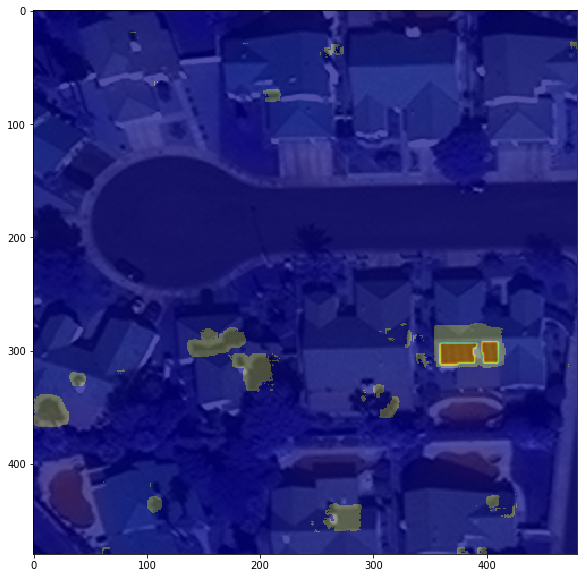

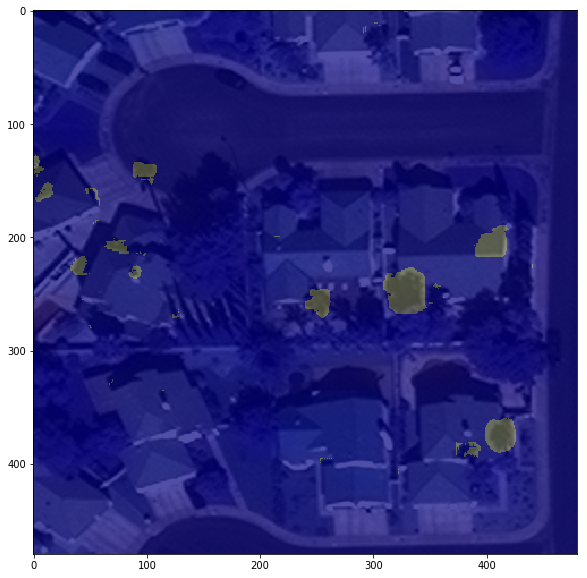

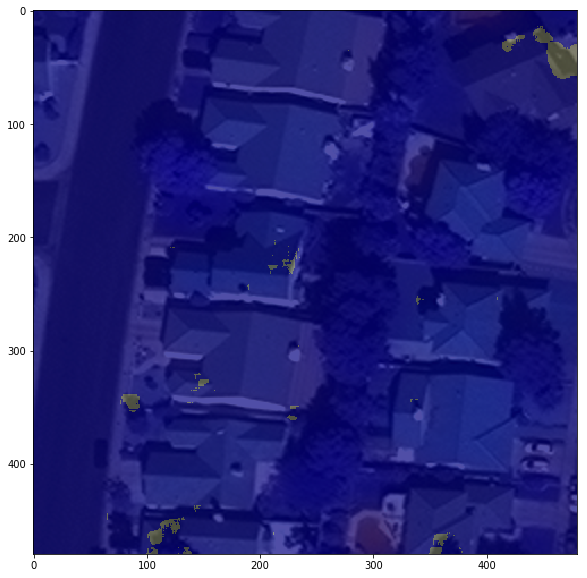

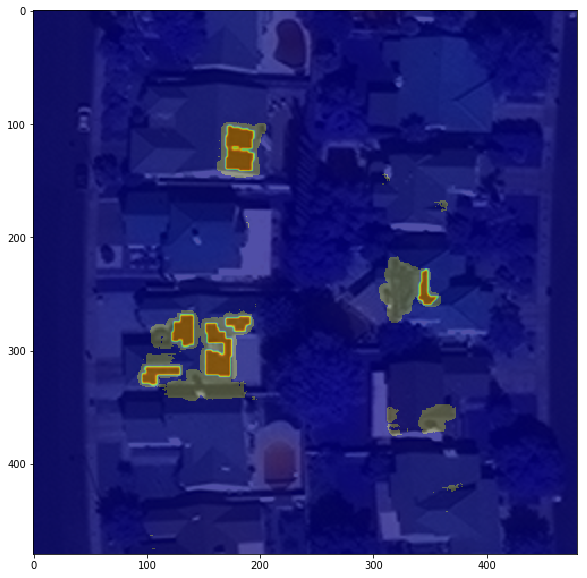

In [266]:
model_json = '/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_SP_480_9_rcheck__50to150e.json'
#weights_file = "/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/loop_weights.h5"

##best from test/train split all data
#weights_file = "/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/checkpoints_panels_bld_480_9r_618newdata/weights.29--9.26562.hdf5"

##last from test/train split all data
weights_file = "/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_SP_480_9_618newdata.h5"


model = import_building_model(model_json, weights_file)

for image in range(len(X_panelL)):
    
    

    
    #print(image)
    #print(X_panelL[image].shape)
    if Y_panelL[image].sum() > -1:
        #prediction = model.predict(X_panelL[image]) > 0.5
        prediction = model.predict(X_panelL[image][None, ...])[0, ...] > 0.8
        building_number_counter(model, X_panelL, image, Y_panelL)
        #prediction = model.predict(X_panelL[image])[0, ...] > 0.3
        #print(prediction.shape)
        fig, ax = plt.subplots(figsize=(10,10))
        ax.imshow(scale_bands(X_panelL[image][:, :, [2,3,5]]))
        #ax.imshow(scale_bands(X_panelL[image][0,:, :, [2,3,5]]))
        targ = Y_panelL[image][:, :, 0]
        ground_truth_build = np.round(Y_buildingsL[image][:,:,0]/Y_buildingsL[image][:,:,0].max())
        #print(unique(ground_truth_build))
        ground_truth_panel = np.round(Y_panelL[image][:,:,0]/Y_panelL[image][:,:,0].max())
        #print(unique(ground_truth_panel))
        build_frac = ground_truth_build.sum()/(Y_buildingsL.shape[1]*Y_buildingsL.shape[2])
        panel_frac = ground_truth_panel.sum()/(Y_panelL.shape[1]*Y_panelL.shape[2])
        #print(ground_truth_panel.sum())
        #print((Y_panelL.shape[1]*Y_panelL.shape[2]))
        print("Building fraction =", build_frac)
        print("Panel fraction = ", panel_frac)
        precision_val,intersection,  FP  = precision_calc(prediction, Y_panelL[image])
        #print("precision = ", precision_val)
        unpredicted_footprint(prediction, Y_panelL[image])
        outside_footprint(prediction, Y_panelL[image])
        #ax.imshow(prediction, cmap='plasma', alpha=0.4)
        ax.imshow(prediction[:,:,0], cmap='plasma', alpha=0.5)
        ax.imshow(targ, cmap='jet', alpha=0.4)
        
    
    else:
        continue

In [286]:
# precision_list = []
# not_predicted = []
# wrong_predict = []

# for image in range(X.shape[0]):
#     prediction = model.predict(X[image][None, ...])[0, ...] > 0.3
#     ground_truth = Y_building[image]
#     precision_val,intersection,  FP  = precision_calc(prediction, ground_truth)
#     not_pred = unpredicted_footprint(prediction, ground_truth)
#     wrong_pred = outside_footprint(prediction, ground_truth)
#     precision_list.append(precision_val)
#     not_predicted.append(not_pred)
#     wrong_predict.append(wrong_pred)

# print(np.mean(precision_list), np.mean(not_predicted), np.mean(wrong_predict))

In [285]:
# buildings_fraction = []
# panels_fraction = []
# for image in range(Y_building.shape[0]):
#     #prediction = model.predict(X[1][None, ...])[0, ...] > 0.3
#     ground_truth_build = np.round(Y_building[image][:,:,0]/Y_building[image][:,:,0].max())
#     ground_truth_panel = np.round(Y_panel[image][:,:,0]/(Y_panel[image][:,:,0].max()+0.001))
#     build_frac = ground_truth_build.sum()/(Y_building.shape[1]*Y_building.shape[2])
#     panel_frac = ground_truth_panel.sum()/(Y_panel.shape[1]*Y_panel.shape[2])
#     buildings_fraction.append(build_frac)
#     panels_fraction.append(panel_frac)
#     #predicted = np.round(prediction[:,:,0] + 0.49)
#     #print("pred values", unique(prediction), "total", prediction.sum())
#     #actual = np.round(ground_truth[:,:,0])
# #print(unique(buildings_fraction))
# print(unique(panels_fraction))
# print(np.mean(buildings_fraction), np.mean(panels_fraction))

In [359]:
json_file = open('/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_480_check.json', 'r')
loaded_model_json = json_file.read()
#print(loaded_model_json)
json_file.close()
model = model_from_json(loaded_model_json)
# load weights into new model
model.load_weights("/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_480_check.h5")
print("Loaded model from disk")
    
Num_predicted_build = []
Num_actual_build = []
 

for image in range(X.shape[0]):
    ground_truth = Y_building#[image]
    nr_objects_true,nr_objects_pred = building_number_counter(model, X, image, ground_truth)
    #prediction = model.predict(X[image][None, ...])[0, ...] > 0.3
    Num_predicted_build.append(nr_objects_pred)
    Num_actual_build.append(nr_objects_true)

    
print(len(Num_predicted_build), len(Num_actual_build))

Loaded model from disk
Predicted Number is 44 
True Number is 49 
Predicted Number is 2 
True Number is 3 
Predicted Number is 46 
True Number is 49 
Predicted Number is 24 
True Number is 25 
Predicted Number is 43 
True Number is 45 
Predicted Number is 11 
True Number is 9 
Predicted Number is 43 
True Number is 44 
Predicted Number is 28 
True Number is 32 
Predicted Number is 51 
True Number is 50 
Predicted Number is 31 
True Number is 35 
Predicted Number is 28 
True Number is 31 
Predicted Number is 31 
True Number is 31 
Predicted Number is 20 
True Number is 22 
Predicted Number is 23 
True Number is 26 
Predicted Number is 34 
True Number is 34 
Predicted Number is 17 
True Number is 22 
Predicted Number is 34 
True Number is 38 
Predicted Number is 16 
True Number is 19 
Predicted Number is 29 
True Number is 30 
Predicted Number is 40 
True Number is 56 
Predicted Number is 35 
True Number is 37 
Predicted Number is 31 
True Number is 37 
Predicted Number is 60 
True Numbe

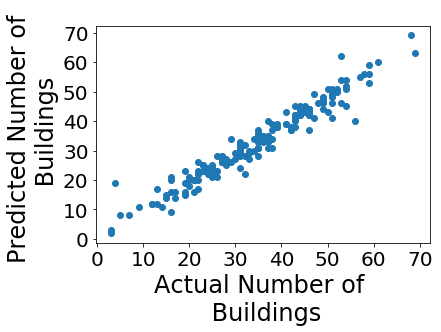

In [367]:
fig = plt.figure()


plt.xlabel('Actual Number of \n Buildings',fontsize=24)
plt.ylabel('Predicted Number of \n Buildings',fontsize=24)

plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)

plt.scatter(Num_actual_build, Num_predicted_build)
plt.show()

In [319]:
def add_building_footprint_count(X):
    X_new = []
   # check = 0
    for image in X:
        new_image = make_building_channel(model, image)
        X_new.append(new_image[None, ...])
    X_new = np.concatenate(X_new, axis=0)
    #print("new train shape", X_train_new.shape)
    #print(check)
    return X_new

In [355]:
# load json and create model
json_file = open('/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_480_check.json', 'r')
loaded_model_json = json_file.read()
#print(loaded_model_json)
json_file.close()
model = model_from_json(loaded_model_json)
# load weights into new model
model.load_weights("/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_480_check.h5")
print("Loaded model from disk")

model_json_panel = '/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_SP_480_9_rcheck__50to150e.json'
    #weights_file = "/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/loop_weights.h5"

    ##best from test/train split all data
    #weights_file = "/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/checkpoints_panels_bld_480_9r_618newdata/weights.29--9.26562.hdf5"

    ##last from test/train split all data
weights_file_panel = "/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_SP_480_9_618newdata.h5"
model_panel = import_building_model(model_json_panel, weights_file_panel)
    
Num_predicted_panels = []
Num_actual_panels = []
X_build = add_building_footprint_count(X)

for image in range(X.shape[0]):
   
     #prediction = model.predict(X[image][None, ...])[0, ...] > 0.3
#     #print(prediction.shape)
#     #fig, ax = plt.subplots(figsize=(10,10))
#     #ax.imshow(scale_bands(X[n][:, :, [2,3,5]]))
#     #targ = Y[n][:, :, 0]
#     #ax.imshow(prediction[:,:,0], cmap='plasma', alpha=0.45)
#     ax.imshow(targ, cmap='jet', alpha=0.4)
#     precision_calc(prediction, Y[n])
#     unpredicted_footprint(prediction, Y[n])
#     outside_footprint(prediction, Y[n])
    num_pred_image = []
    num_actual_image = []    
   
    X_panelL, Y_panelL, Y_buildingsL =subset_test_image(X_build[image], Y_panel[image], Y_building[image], 4)
    
    for sub_image in range(len(X_panelL)):

        if Y_panelL[sub_image].sum() > -1:
            #prediction = model.predict(X_panelL[image]) > 0.5
            prediction = model_panel.predict(X_panelL[sub_image][None, ...])[0, ...] > 0.8
            nr_objects_true,nr_objects_pred = building_number_counter(model_panel, X_panelL, sub_image, Y_panelL)
            num_pred_image.append(nr_objects_pred)
            num_actual_image.append(nr_objects_true)


        else:
            continue
    #print("pred =", num_pred_image)
    #print("true =", num_actual_image)
    total_pred_panel = sum(num_pred_image)
    total_actual_panel = sum(num_actual_image)
    #print("total pred", total_pred_panel)# = sum(num_pred_image)
    #print("total actual",total_actual_panel)# = sum(num_actual_image)
    #ground_truth = Y_building#[image]
    #nr_objects_true,nr_objects_pred = building_number_counter(model, X, image, ground_truth)
    ##prediction = model.predict(X[image][None, ...])[0, ...] > 0.3
    Num_predicted_panels.append(total_pred_panel)
    Num_actual_panels.append(total_actual_panel)

    
print(len(Num_predicted_panels), len(Num_actual_panels))

Loaded model from disk
Loaded model from disk
Predicted Number is 2 
True Number is 0 
Predicted Number is 5 
True Number is 2 
Predicted Number is 4 
True Number is 0 
Predicted Number is 2 
True Number is 0 
Predicted Number is 0 
True Number is 0 
Predicted Number is 2 
True Number is 1 
Predicted Number is 0 
True Number is 0 
Predicted Number is 3 
True Number is 0 
Predicted Number is 4 
True Number is 0 
Predicted Number is 11 
True Number is 0 
Predicted Number is 3 
True Number is 2 
Predicted Number is 8 
True Number is 1 
Predicted Number is 4 
True Number is 0 
Predicted Number is 2 
True Number is 0 
Predicted Number is 8 
True Number is 1 
Predicted Number is 3 
True Number is 0 
Predicted Number is 10 
True Number is 0 
Predicted Number is 13 
True Number is 3 
Predicted Number is 23 
True Number is 0 
Predicted Number is 10 
True Number is 1 
Predicted Number is 13 
True Number is 0 
Predicted Number is 0 
True Number is 0 
Predicted Number is 8 
True Number is 1 
Predi

Predicted Number is 7 
True Number is 0 
Predicted Number is 9 
True Number is 0 
Predicted Number is 12 
True Number is 1 
Predicted Number is 19 
True Number is 1 
Predicted Number is 3 
True Number is 0 
Predicted Number is 2 
True Number is 3 
Predicted Number is 7 
True Number is 0 
Predicted Number is 6 
True Number is 7 
Predicted Number is 16 
True Number is 0 
Predicted Number is 2 
True Number is 0 
Predicted Number is 4 
True Number is 0 
Predicted Number is 1 
True Number is 0 
Predicted Number is 10 
True Number is 3 
Predicted Number is 0 
True Number is 0 
Predicted Number is 4 
True Number is 0 
Predicted Number is 2 
True Number is 2 
Predicted Number is 1 
True Number is 0 
Predicted Number is 2 
True Number is 1 
Predicted Number is 1 
True Number is 0 
Predicted Number is 3 
True Number is 1 
Predicted Number is 5 
True Number is 0 
Predicted Number is 3 
True Number is 1 
Predicted Number is 5 
True Number is 3 
Predicted Number is 6 
True Number is 0 
Predicted Nu

Predicted Number is 2 
True Number is 0 
Predicted Number is 8 
True Number is 0 
Predicted Number is 3 
True Number is 7 
Predicted Number is 6 
True Number is 3 
Predicted Number is 5 
True Number is 0 
Predicted Number is 2 
True Number is 2 
Predicted Number is 9 
True Number is 2 
Predicted Number is 5 
True Number is 2 
Predicted Number is 0 
True Number is 0 
Predicted Number is 8 
True Number is 6 
Predicted Number is 9 
True Number is 0 
Predicted Number is 0 
True Number is 0 
Predicted Number is 6 
True Number is 0 
Predicted Number is 10 
True Number is 2 
Predicted Number is 4 
True Number is 6 
Predicted Number is 6 
True Number is 1 
Predicted Number is 4 
True Number is 4 
Predicted Number is 0 
True Number is 0 
Predicted Number is 1 
True Number is 0 
Predicted Number is 8 
True Number is 0 
Predicted Number is 2 
True Number is 0 
Predicted Number is 5 
True Number is 4 
Predicted Number is 3 
True Number is 2 
Predicted Number is 2 
True Number is 0 
Predicted Numbe

Predicted Number is 2 
True Number is 0 
Predicted Number is 2 
True Number is 6 
Predicted Number is 2 
True Number is 0 
Predicted Number is 4 
True Number is 1 
Predicted Number is 8 
True Number is 3 
Predicted Number is 7 
True Number is 1 
Predicted Number is 10 
True Number is 0 
Predicted Number is 4 
True Number is 0 
Predicted Number is 13 
True Number is 0 
Predicted Number is 11 
True Number is 3 
Predicted Number is 11 
True Number is 1 
Predicted Number is 12 
True Number is 1 
Predicted Number is 11 
True Number is 0 
Predicted Number is 17 
True Number is 3 
Predicted Number is 0 
True Number is 0 
Predicted Number is 3 
True Number is 0 
Predicted Number is 15 
True Number is 3 
Predicted Number is 7 
True Number is 2 
Predicted Number is 0 
True Number is 0 
Predicted Number is 9 
True Number is 0 
Predicted Number is 6 
True Number is 2 
Predicted Number is 4 
True Number is 2 
Predicted Number is 11 
True Number is 1 
Predicted Number is 2 
True Number is 0 
Predict

In [349]:
len(X_panelL)

4

In [356]:
len(Num_predicted_panels)

172

In [357]:
len(Num_actual_panels)

172

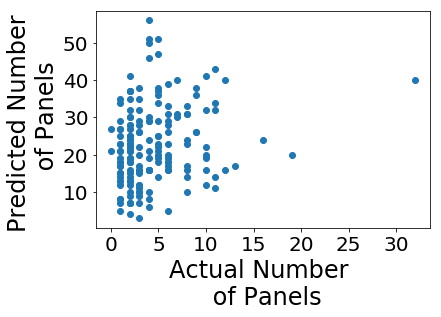

In [371]:
fig = plt.figure()


plt.xlabel('Actual Number \n of Panels',fontsize=24)
plt.ylabel('Predicted Number \n of Panels',fontsize=24)

plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)


plt.scatter(Num_actual_panels, Num_predicted_panels)
plt.show()

In [ ]:
model_json = '/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_SP_480_9_rcheck__50to150e.json'
#weights_file = "/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/loop_weights.h5"

##best from test/train split all data
#weights_file = "/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/checkpoints_panels_bld_480_9r_618newdata/weights.29--9.26562.hdf5"

##last from test/train split all data
weights_file = "/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_SP_480_9_618newdata.h5"


model = import_building_model(model_json, weights_file)

for image in range(len(X_panelL)):
    #print(image)
    #print(X_panelL[image].shape)
    if Y_panelL[image].sum() > -1:
        #prediction = model.predict(X_panelL[image]) > 0.5
        prediction = model.predict(X_panelL[image][None, ...])[0, ...] > 0.8
        building_number_counter(model, X_panelL, image, Y_panelL)
        #prediction = model.predict(X_panelL[image])[0, ...] > 0.3
        #print(prediction.shape)
        fig, ax = plt.subplots(figsize=(10,10))
        ax.imshow(scale_bands(X_panelL[image][:, :, [2,3,5]]))
        #ax.imshow(scale_bands(X_panelL[image][0,:, :, [2,3,5]]))
        targ = Y_panelL[image][:, :, 0]
        ground_truth_build = np.round(Y_buildingsL[image][:,:,0]/Y_buildingsL[image][:,:,0].max())
        #print(unique(ground_truth_build))
        ground_truth_panel = np.round(Y_panelL[image][:,:,0]/Y_panelL[image][:,:,0].max())
        #print(unique(ground_truth_panel))
        build_frac = ground_truth_build.sum()/(Y_buildingsL.shape[1]*Y_buildingsL.shape[2])
        panel_frac = ground_truth_panel.sum()/(Y_panelL.shape[1]*Y_panelL.shape[2])
        #print(ground_truth_panel.sum())
        #print((Y_panelL.shape[1]*Y_panelL.shape[2]))
        print("Building fraction =", build_frac)
        print("Panel fraction = ", panel_frac)
        precision_val,intersection,  FP  = precision_calc(prediction, Y_panelL[image])
        #print("precision = ", precision_val)
        unpredicted_footprint(prediction, Y_panelL[image])
        outside_footprint(prediction, Y_panelL[image])
        #ax.imshow(prediction, cmap='plasma', alpha=0.4)
        ax.imshow(prediction[:,:,0], cmap='plasma', alpha=0.5)
        ax.imshow(targ, cmap='jet', alpha=0.4)
        
    
    else:
        continue

In [37]:
len(buildings_fraction)

172

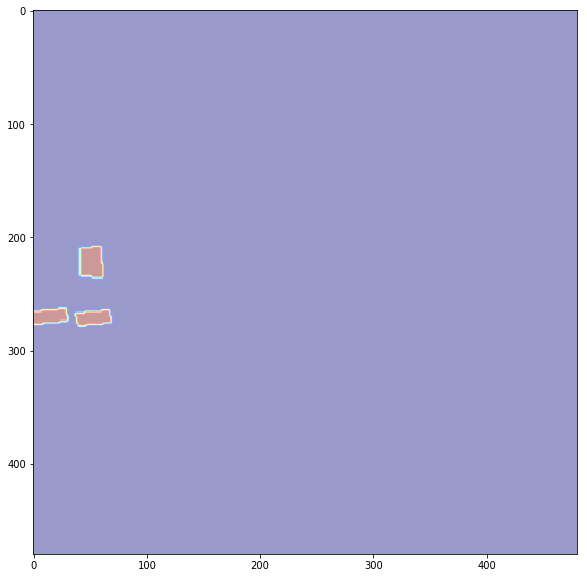

In [342]:
#targ = Y[n][:, :, 0]
#ax.imshow(prediction[:,:,0], cmap='plasma', alpha=0.4)
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(targ, cmap='jet', alpha=0.4)

Number of objects is 5 


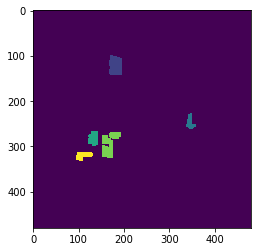

In [268]:
#!/usr/bin/env python
import scipy
from scipy import ndimage

# read image into numpy array
# $ wget http://pythonvision.org/media/files/images/dna.jpeg
#dna = scipy.misc.imread('dna.jpeg') # gray-scale image


# smooth the image (to remove small objects); set the threshold
dnaf = ndimage.gaussian_filter(targ, .02)
T = 0.1 # set threshold by hand to avoid installing `mahotas` or
       # `scipy.stsci.image` dependencies that have threshold() functions

# find connected components
labeled, nr_objects = ndimage.label(dnaf > T) # `dna[:,:,0]>T` for red-dot case
print "Number of objects is %d " % nr_objects

# show labeled image
####scipy.misc.imsave('labeled_dna.png', labeled)
####scipy.misc.imshow(labeled) # black&white image
import matplotlib.pyplot as plt
#plt.imsave('labeled_dna.png', labeled)
plt.imshow(labeled)

plt.show()

In [269]:
labeled

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ..., 
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

In [274]:
np.count_nonzero(labeled)

4230

In [277]:
panel_pixel_count = np.bincount(np.ndarray.flatten(labeled))

In [278]:
panel_areas = panel_pixel_count[1:]*(0.2*0.2)

In [280]:
panel_areas

array([ 46.64,  17.44,  24.24,  59.6 ,  21.28])

In [304]:
def calc_power_output(predicted_solar_panel_array, pixel_size_m):
    targ = predicted_solar_panel_array[:,:,0]
    #get number of pixels
    dnaf = ndimage.gaussian_filter(targ, .02)
    T = 0.1 # set threshold by hand to avoid installing `mahotas` or
       # `scipy.stsci.image` dependencies that have threshold() functions

    # find connected components
    labeled, nr_objects = ndimage.label(dnaf > T) # `dna[:,:,0]>T` for red-dot case
    panel_pixel_count = np.bincount(np.ndarray.flatten(labeled))
    panel_areas = panel_pixel_count[1:]*(pixel_size_m*pixel_size_m)
    print("Total panel area in m2 = ",panel_areas)
    print("Total numer of panels in the image =",nr_objects)
    tilt_angle = 15     #degrees
    max_irr = 6.25     #kWh/m2/day
    min_irr = 4.94     #kWh/m2/day
    module_efficiency = .15    #good ones are 20%, bad ones are 10%
    AC_DC_converter_efficiency = 0.95
    kWh_Daily_energy_output = panel_areas.sum()*AC_DC_converter_efficiency*((max_irr+min_irr)/2) * module_efficiency  #kWh/day
    kW_Daily_energy_output = kWh_Daily_energy_output/24
    return kWh_Daily_energy_output,kW_Daily_energy_output

In [305]:
energy_kWh,power_kW  = calc_power_output(Y_panelL[3], .2)

('Total panel area in m2 = ', array([ 46.64,  17.44,  24.24,  59.6 ,  21.28]))
('Total numer of panels in the image =', 5)


In [306]:
print(energy_kWh,power_kW)

(134.90104500000001, 5.6208768750000004)


In [ ]:
def solar_panel_concentration(Y_panelL[3], .2)::
    #solar panels/building

In [ ]:
# load json and create model
json_file = open('/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_480_check.json', 'r')
loaded_model_json = json_file.read()
#print(loaded_model_json)
json_file.close()
model = model_from_json(loaded_model_json)
# load weights into new model
model.load_weights("/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_480_check.h5")
print("Loaded model from disk")

In [90]:
test_df

,index,geojson_files,image_file
0,87,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...
1,105,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...
2,113,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...
3,5,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...
4,45,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...
5,3,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...
6,28,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...
7,110,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...
8,12,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...
9,41,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,/home/vaston/Metis_Project_5/Las_Vegas_Picture...


In [71]:
df_panel_buildings.head()

,BuildingId,ImageId,geometry
2577,1,AOI_2_Vegas_img3223,"POLYGON ((-115.223118878 36.18622112200006, -1..."
2578,2,AOI_2_Vegas_img3223,"POLYGON ((-115.222072358 36.18622980200007, -1..."
2579,3,AOI_2_Vegas_img3223,"POLYGON ((-115.222480929 36.18624092800007, -1..."
2580,4,AOI_2_Vegas_img3223,POLYGON ((-115.2217655041279 36.18621269984521...
2581,5,AOI_2_Vegas_img3223,POLYGON ((-115.2215266725359 36.18621269984521...


In [18]:
#df_vectors.file[1].split('pen_')[1].split('.geo')[0]

'AOI_2_Vegas_img1530'

In [39]:
df_panel_vectors.head()

,file,geometry
0,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,POLYGON ((-115.2650398975762 36.21573558910455...
1,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,"POLYGON ((-115.265021872979 36.21573558910455,..."
2,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,POLYGON ((-115.2649868840549 36.21572657680593...
3,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,POLYGON ((-115.2649587868887 36.21571226315518...
4,/home/vaston/Metis_Project_5/Las_Vegas_Picture...,POLYGON ((-115.2646473324511 36.21519723679586...


In [40]:
df_building_footprints.head()

,BuildingId,ImageId,geometry
2577,1,AOI_2_Vegas_img3223,"POLYGON ((-115.223118878 36.18622112200006, -1..."
2578,2,AOI_2_Vegas_img3223,"POLYGON ((-115.222072358 36.18622980200007, -1..."
2579,3,AOI_2_Vegas_img3223,"POLYGON ((-115.222480929 36.18624092800007, -1..."
2580,4,AOI_2_Vegas_img3223,POLYGON ((-115.2217655041279 36.18621269984521...
2581,5,AOI_2_Vegas_img3223,POLYGON ((-115.2215266725359 36.18621269984521...


In [28]:
building_footprints_check = building_footprints[building_footprints['ImageId']=='AOI_2_Vegas_img1209']

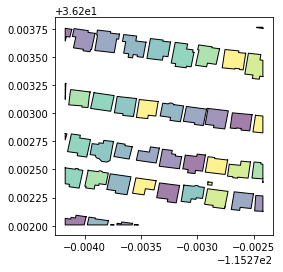

In [29]:
building_footprints_check.plot()

Generate the sets of panel and building footprints

In [3]:
X_train = np.load('Train_set_Buildings_480_X.npy')
Y_train = np.load('Train_set_Buildings_480_Y.npy')
X_val = np.load('Test_set_Buildings_480_X.npy')
Y_val = np.load('Test_set_Buildings_480_Y.npy')

In [4]:
from keras.models import Sequential
from keras.layers import Dense
from keras.models import model_from_json
import numpy
import os


# load json and create model
json_file = open('/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_480_check.json', 'r')
loaded_model_json = json_file.read()
#print(loaded_model_json)
json_file.close()
model = model_from_json(loaded_model_json)
# load weights into new model
model.load_weights("/home/vaston/Metis_Project_5/Las_Vegas_Pictures/AOI_2_Vegas_Train/model_480_check.h5")
print("Loaded model from disk")
 
#print(model.summary())

Using TensorFlow backend.


Loaded model from disk


In [5]:
# Function to create an iterator with examples
def get_examples():
    for i in range(Y_val.shape[0]):
        #print(i)
        if Y_val[i, ...].sum() > 0.5:
            X = X_val[i]
            #print(X)
            Y = Y_val[i]
            print(Y_val[i].shape)
            print(X_val[i].shape)
            yield X, Y

# Function to plot a single example
def plot_example(X, Y, model):
    # Apply the model to this example
    prediction = model.predict(X[None, ...])[0, ...] > 0.15
    #print(prediction)
    
    fig, axes = plt.subplots(1,3, figsize=(15,15))
    tno = 0
    # Iterate through each target class
    #for tno in range(1):
        
    targ = Y[:, :, tno]
    pred = prediction[:, :, tno]

    ax1, ax2, ax3 = axes
    ax1.imshow(scale_bands(X[:, :, [4,2,1]])) # This index starts at 0, so I had to decrement

    #ax1.imshow(scale_bands(X[:, :, [4,2,1]])) # This index starts at 0, so I had to decrement
    ax2.imshow(targ, vmin=0, vmax=1)
    ax3.imshow(pred, vmin=0, vmax=1)

    ax1.set_title('Image')
    ax2.set_title('Ground Truth')
    ax3.set_title('Prediction')
    plt.show()


# # If you need to load the model, you can use these lines.  Change the weights filename to match one you have.
#model = get_unet()
#model.load_weights('checkpoints/weights.99-0.07128.hdf5')


example_generator = get_examples()

In [6]:
X, Y = next(example_generator)
plot_example(X, Y, model)

(480, 480, 1)
(480, 480, 8)


ResourceExhaustedError: OOM when allocating tensor with shape[1,32,480,480]
	 [[Node: conv2d_36/convolution = Conv2D[T=DT_FLOAT, data_format="NHWC", padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/gpu:0"](concatenate_8/concat, conv2d_36/kernel/read)]]

Caused by op u'conv2d_36/convolution', defined at:
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/runpy.py", line 174, in _run_module_as_main
    "__main__", fname, loader, pkg_name)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/runpy.py", line 72, in _run_code
    exec code in run_globals
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/ipykernel/kernelapp.py", line 477, in start
    ioloop.IOLoop.instance().start()
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/zmq/eventloop/ioloop.py", line 177, in start
    super(ZMQIOLoop, self).start()
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/tornado/ioloop.py", line 888, in start
    handler_func(fd_obj, events)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/zmq/eventloop/zmqstream.py", line 440, in _handle_events
    self._handle_recv()
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/zmq/eventloop/zmqstream.py", line 472, in _handle_recv
    self._run_callback(callback, msg)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/zmq/eventloop/zmqstream.py", line 414, in _run_callback
    callback(*args, **kwargs)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/ipykernel/kernelbase.py", line 283, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/ipykernel/kernelbase.py", line 235, in dispatch_shell
    handler(stream, idents, msg)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/ipykernel/kernelbase.py", line 399, in execute_request
    user_expressions, allow_stdin)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/ipykernel/ipkernel.py", line 196, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/ipykernel/zmqshell.py", line 533, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 2718, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 2822, in run_ast_nodes
    if self.run_code(code, result):
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-4-6d473fde835a>", line 13, in <module>
    model = model_from_json(loaded_model_json)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/keras/models.py", line 325, in model_from_json
    return layer_module.deserialize(config, custom_objects=custom_objects)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/keras/layers/__init__.py", line 46, in deserialize
    printable_module_name='layer')
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/keras/utils/generic_utils.py", line 140, in deserialize_keras_object
    list(custom_objects.items())))
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/keras/engine/topology.py", line 2374, in from_config
    process_layer(layer_data)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/keras/engine/topology.py", line 2369, in process_layer
    layer(input_tensors[0], **kwargs)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/keras/engine/topology.py", line 554, in __call__
    output = self.call(inputs, **kwargs)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/keras/layers/convolutional.py", line 164, in call
    dilation_rate=self.dilation_rate)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/keras/backend/tensorflow_backend.py", line 2862, in conv2d
    data_format='NHWC')
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/tensorflow/python/ops/nn_ops.py", line 661, in convolution
    op=op)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/tensorflow/python/ops/nn_ops.py", line 331, in with_space_to_batch
    return op(input, num_spatial_dims, padding)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/tensorflow/python/ops/nn_ops.py", line 653, in op
    name=name)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/tensorflow/python/ops/nn_ops.py", line 129, in _non_atrous_convolution
    name=name)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/tensorflow/python/ops/gen_nn_ops.py", line 403, in conv2d
    data_format=data_format, name=name)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/tensorflow/python/framework/op_def_library.py", line 768, in apply_op
    op_def=op_def)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/tensorflow/python/framework/ops.py", line 2336, in create_op
    original_op=self._default_original_op, op_def=op_def)
  File "/home/ubuntu/anaconda2/envs/scienv2/lib/python2.7/site-packages/tensorflow/python/framework/ops.py", line 1228, in __init__
    self._traceback = _extract_stack()

ResourceExhaustedError (see above for traceback): OOM when allocating tensor with shape[1,32,480,480]
	 [[Node: conv2d_36/convolution = Conv2D[T=DT_FLOAT, data_format="NHWC", padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/gpu:0"](concatenate_8/concat, conv2d_36/kernel/read)]]


In [7]:
from descartes import PolygonPatch

def plot_example(X, Y, model):
    # Apply the model to this example
    prediction = model.predict(X[None, ...])[0, ...] > 0.15
    print(prediction)
    fig, ax = plt.subplots(figsize=(12,12))
    #fig, axes = plt.subplots(1,3, figsize=(15,15))
    tno = 0
    # Iterate through each target class
    #for tno in range(1):
        
    targ = Y[:, :, tno]
    pred = prediction[:, :, tno]
    
    #ax1, ax2, ax3 = axes
    ax.imshow(scale_bands(X[:, :, [4,2,1]])) # This index starts at 0, so I had to decrement

    #ax1.imshow(scale_bands(X[:, :, [4,2,1]])) # This index starts at 0, so I had to decrement
    #ax2.imshow(targ, vmin=0, vmax=1)
    #ax3.imshow(pred, vmin=0, vmax=1)
    ax.imshow(pred, cmap='jet', alpha=0.5) #, fc='g', alpha=0.4, hatch='//')
    #ax.add_patch(PolygonPatch(pred, fc='g', alpha=0.4, hatch='//'))
    
    #ax1.set_title('Image')
    #ax2.set_title('Ground Truth')
    #ax3.set_title('Prediction')
    plt.show()

In [1]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(scale_bands(X_val[10][:, :, [2,6,7]]))
targ = pred
ax.imshow(targ, cmap='jet', alpha=0.3)

#X_val[3][:,:,7].max()#.shape

NameError: name 'plt' is not defined

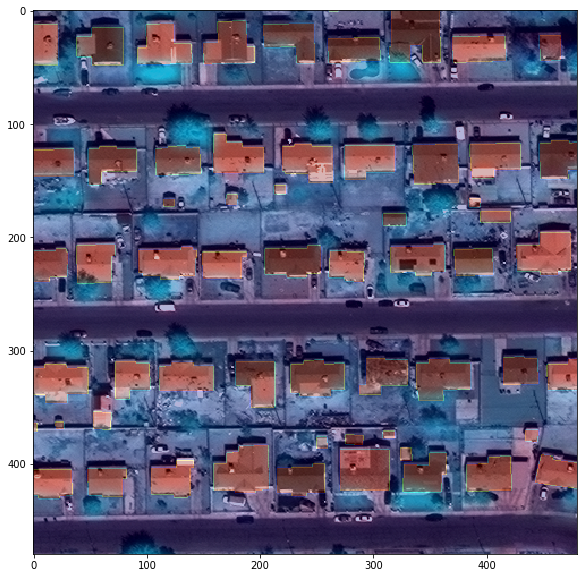

In [8]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(scale_bands(X_val[10][:, :, [2,6,7]]))
targ = Y_val[10][:, :, 0]
ax.imshow(targ, cmap='jet', alpha=0.3)

#X_val[3][:,:,7].max()#.shape

In [9]:
prediction = model.predict(X_val[3][None, ...])[0, ...] > 0.15
#print(prediction)

[[[False]
  [False]
  [False]
  ..., 
  [False]
  [False]
  [False]]

 [[False]
  [False]
  [False]
  ..., 
  [False]
  [False]
  [False]]

 [[False]
  [False]
  [False]
  ..., 
  [False]
  [False]
  [False]]

 ..., 
 [[False]
  [False]
  [False]
  ..., 
  [False]
  [False]
  [False]]

 [[False]
  [False]
  [False]
  ..., 
  [False]
  [False]
  [False]]

 [[False]
  [False]
  [False]
  ..., 
  [False]
  [False]
  [ True]]]


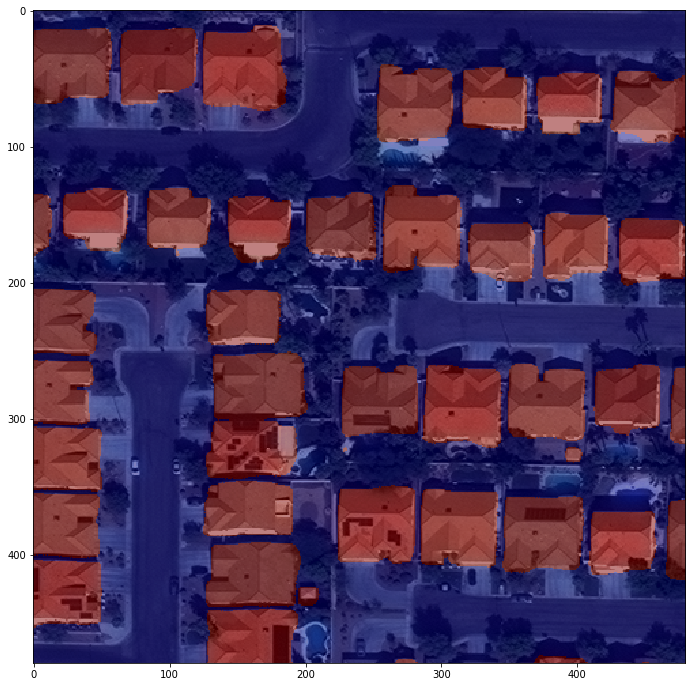

In [10]:
plot_example(X_val[3], Y_val[3], model)

## Error metrics

In [11]:
n = 10

In [12]:
Y_test = Y_val[n][:, :, 0]> 0.15

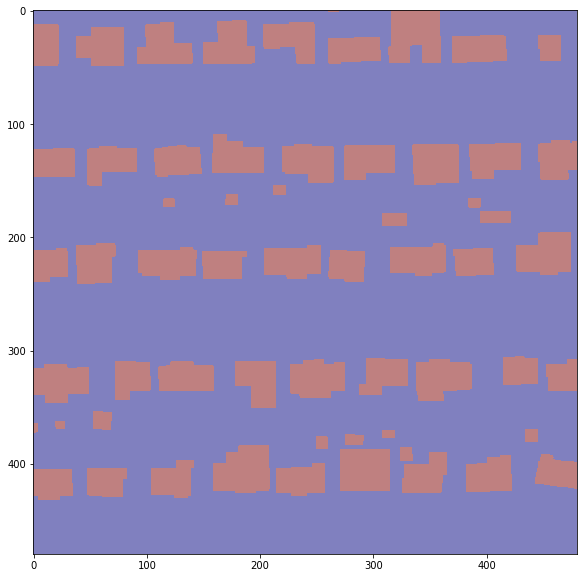

In [13]:
fig, ax = plt.subplots(figsize=(10,10))
#ax.imshow(scale_bands(X_val[n][:, :, [2,6,7]]))
targ = Y_test
#targ = Y_val[n][:, :, 0]
ax.imshow(targ, cmap='jet', alpha=0.5)

In [14]:
Y_test.sum()

53280

In [15]:
Y_test[1,1]

False

In [16]:
Pred_test = model.predict(X_val[n][None, ...])[0, ...]> 0.15

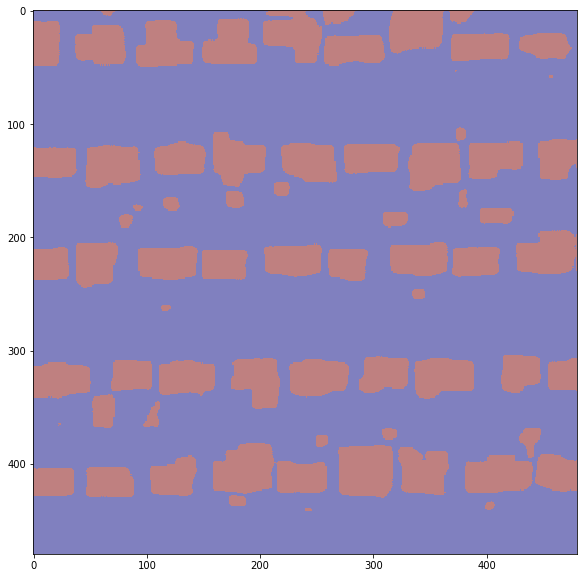

In [17]:
fig, ax = plt.subplots(figsize=(10,10))
#ax.imshow(scale_bands(X_val[3][:, :, [2,6,7]]))
targ = Pred_test[:,:,0]
#targ = Y_val[n][:, :, 0]
ax.imshow(targ, cmap='jet', alpha=0.5)

In [18]:
Pred_test[:,:,0].sum()

61703

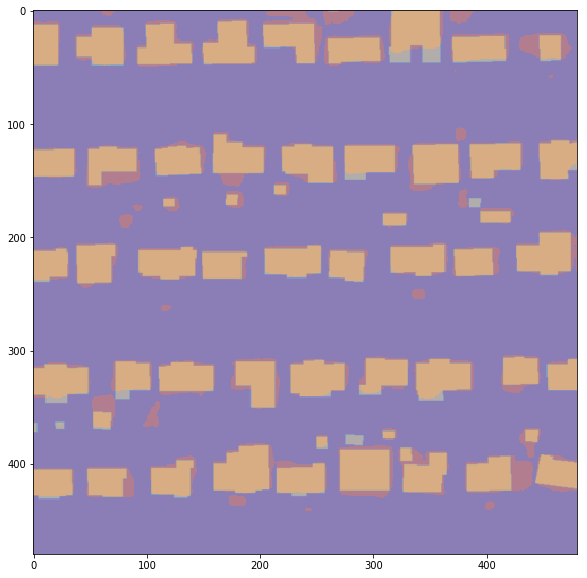

In [19]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(Y_val[n][:, :, 0], alpha=0.3)
targ = Pred_test[:,:,0]
#targ = Y_val[n][:, :, 0]
ax.imshow(targ, cmap='jet', alpha=0.3)

Fraction of the ground truth that the model predicts correctly:

In [20]:
def find_footprint_intersection(array_1, array_2):
    x,y = array_1.shape
    print(x,y)
    intersection_array =  numpy.zeros((x, y))#[[0 for i in range(x)] for j in range(y)]
    print(intersection_array.shape)
    for i in range(x):
        i = int(i)
        #print(i)
        for j in range(y):
            j= int(j)
            #print(j)
            if array_1[i][j] == array_2[i][j] and array_1[i][j] == 1:
                intersection_array[i][j]=1
            elif array_1[i][j] == array_2[i][j] and array_1[i][j] == 0:
                intersection_array[i][j]=0
            else:
                intersection_array[i][j]=0
    
    return intersection_array.sum(), intersection_array
        

In [21]:
overlap, intersection_array = find_footprint_intersection(Y_test, Pred_test[:,:,0])

(480, 480)
(480, 480)


('the ground truth area is', 53280)
('the model area is', 61703)
('The overlap between model and ground truth =', 50813.0)
('So, the fraction of the ground truth the model gets right is', 0.95369744744744744)


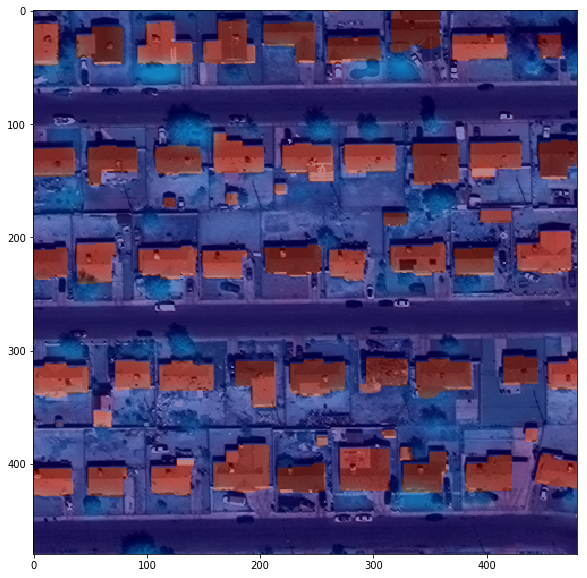

In [22]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(scale_bands(X_val[n][:, :, [2,6,7]]))
targ = intersection_array
#targ = Y_val[n][:, :, 0]
ax.imshow(targ, cmap='jet', alpha=0.5)

print("the ground truth area is",Y_test.sum() )
print("the model area is",Pred_test[:,:,0].sum() )
print("The overlap between model and ground truth =", overlap)
print("So, the fraction of the ground truth the model gets right is", (overlap/Y_test.sum()) )


Fraction of the model that is predicting non-ground truth:

In [23]:
def erroneous_building(ground_truth_array, model_array):
    x,y = ground_truth_array.shape
    print(x,y)
    intersection_array =  numpy.zeros((x, y))#[[0 for i in range(x)] for j in range(y)]
    print(intersection_array.shape)
    for i in range(x):
        i = int(i)
        #print(i)
        for j in range(y):
            j= int(j)
            #print(j)
            if ground_truth_array[i][j] != model_array[i][j] and model_array[i][j] == 1:
                intersection_array[i][j]=1
            elif ground_truth_array[i][j] != model_array[i][j] and model_array[i][j] == 0:
                intersection_array[i][j]=0
            else:
                intersection_array[i][j]=0
    
    return intersection_array.sum(), intersection_array
        

In [24]:
extra_footprint, extra_array = erroneous_building(Y_test, Pred_test[:,:,0])

(480, 480)
(480, 480)


('fraction of model prediction that is incorrect =', 0.17649060823622839)


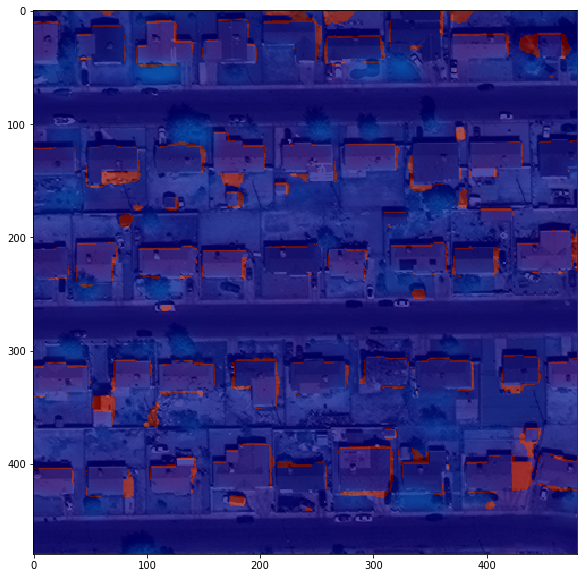

In [25]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(scale_bands(X_val[n][:, :, [2,6,7]]))
targ = extra_array
#targ = Y_val[n][:, :, 0]
ax.imshow(targ, cmap='jet', alpha=0.7)
print("fraction of model prediction that is incorrect =", extra_array.sum()/Pred_test[:,:,0].sum())

Fraction of the ground truth that does not get predicted:

In [26]:
def ground_truth_not_seen(ground_truth_array, model_array):
    x,y = ground_truth_array.shape
    print(x,y)
    intersection_array =  numpy.zeros((x, y))#[[0 for i in range(x)] for j in range(y)]
    print(intersection_array.shape)
    for i in range(x):
        i = int(i)
        #print(i)
        for j in range(y):
            j= int(j)
            #print(j)
            if ground_truth_array[i][j] == 1 and ground_truth_array[i][j] != model_array[i][j]:
                intersection_array[i][j]=1
            elif ground_truth_array[i][j] == 0 and ground_truth_array[i][j] != model_array[i][j]:
                intersection_array[i][j]=0
            else:
                intersection_array[i][j]=0
    
    return intersection_array.sum(), intersection_array
        

In [27]:
unseen_footprint, unseen_array = ground_truth_not_seen(Y_test, Pred_test[:,:,0])

(480, 480)
(480, 480)


In [28]:
unseen_footprint

2467.0

('fraction of ground truth the model does not see', 0.046302552552552549)


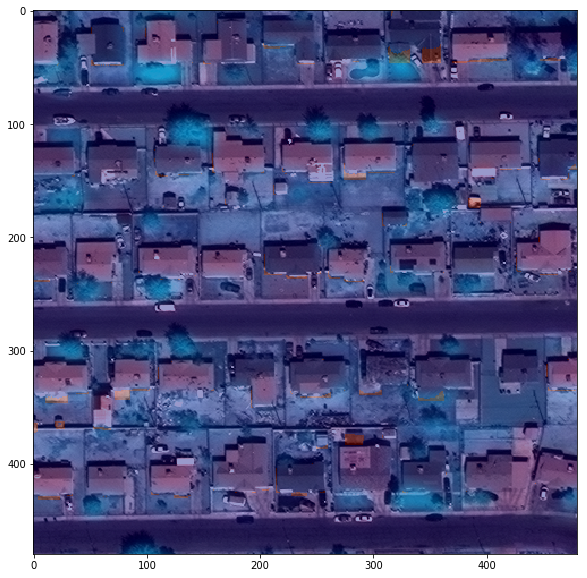

In [29]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(scale_bands(X_val[n][:, :, [2,6,7]]))
targ = unseen_array
#targ = Y_val[n][:, :, 0]
ax.imshow(targ, cmap='jet', alpha=0.4)
print("fraction of ground truth the model does not see", unseen_footprint/Y_test.sum() )

Try to add the predicted building footprint as a channel:

In [87]:
#input_size = 240
import numpy.ma as ma
n=50

def make_building_channel(model, X):
    Pred_test = model.predict(X[None, ...])[0, ...]> 0.2
    print(Pred_test.shape)
    building_mask = Pred_test[:,:,0]
    print(X.shape)
    print(Pred_test.shape)
    #X_new = np.concatenate([X,building_mask],axis=2)
    X_new = np.dstack([X,building_mask])
    print(X_new.shape)
    return X_new

In [88]:
X_new  = make_building_channel(model,X_val[n])

(480, 480, 1)
(480, 480, 8)
(480, 480, 1)
(480, 480, 9)


In [89]:
for l in range(9):
    print(X_new[:,:,l].max())
    print(X_new[:,:,l].min())

1.0
-0.945098
1.0
-0.945098
1.0
-1.0
1.0
-1.0
1.0
-1.0
1.0
-1.0
0.992157
-1.0
0.905882
-1.0
1.0
0.0


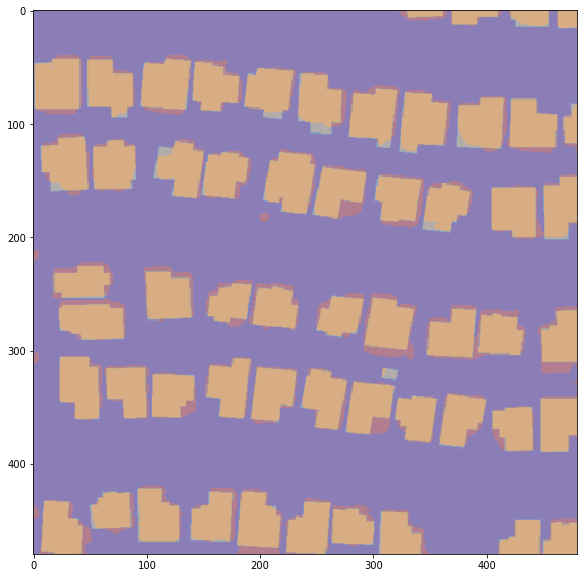

In [90]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(Y_val[n][:, :, 0], alpha=0.3)
targ = X_new[:,:,8]
#targ = Y_val[n][:, :, 0]
ax.imshow(targ, cmap='jet', alpha=0.3)

## Try image rotating, mirroring, resizing, etc. 

First try rotating:

In [91]:
from scipy.ndimage import rotate
X_rotated = rotate(X_val[n], 90)
Y_rotated = rotate(Y_val[n][:, :, 0], 90)
#Y_rotated = rotate(Y_val[n][:, :, 0]> 0.15, 90)

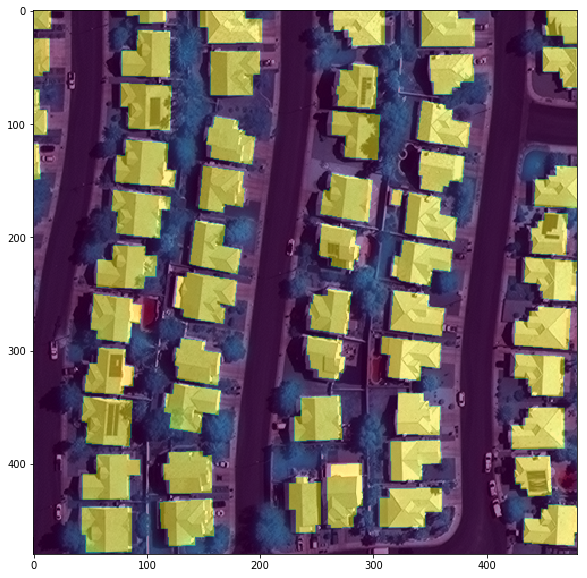

In [92]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(scale_bands(X_rotated[:, :, [2,6,7]]))
ax.imshow(Y_rotated, alpha = 0.5)

Now mirroring around x and y axes:

In [93]:
X_flipped_lr = np.fliplr(X_val[n])
Y_flipped_lr = np.fliplr(Y_val[n][:, :, 0])
X_flipped_ud = np.flipud(X_val[n])
Y_flipped_ud = np.flipud(Y_val[n][:, :, 0])



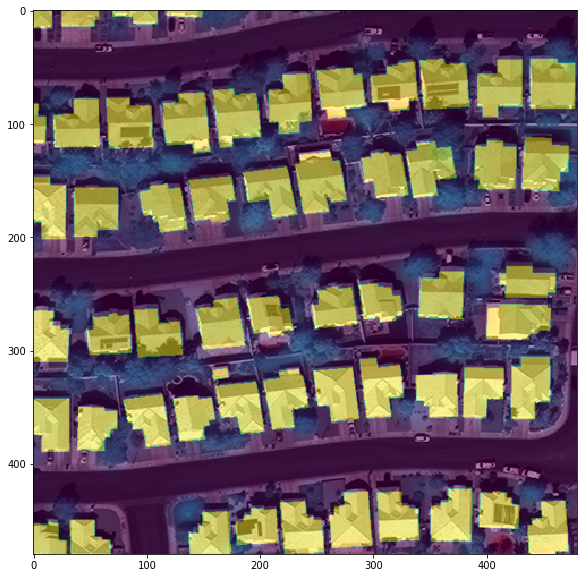

In [94]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(scale_bands(X_flipped_lr[:, :, [2,6,7]]))
ax.imshow(Y_flipped_lr, alpha = 0.5)

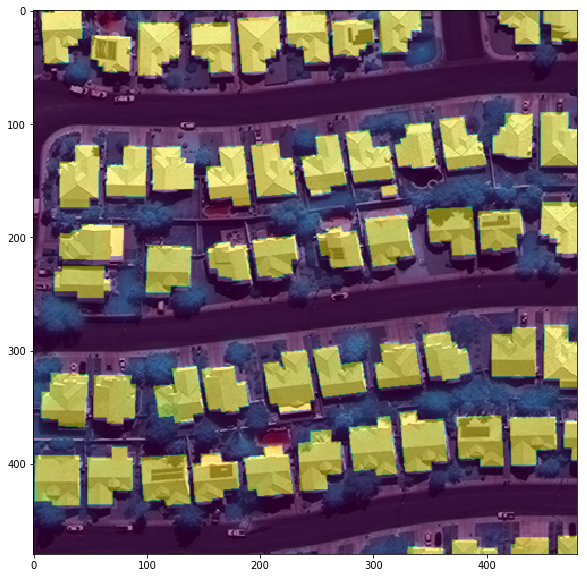

In [95]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(scale_bands(X_flipped_ud[:, :, [2,6,7]]))
ax.imshow(Y_flipped_ud, alpha = 0.5)

Now try resizing:

In [96]:
original_shape

(650, 650)

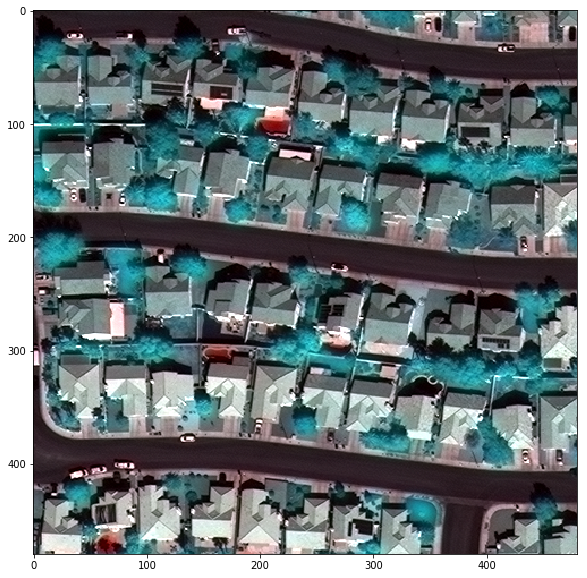

In [97]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(scale_bands(X_val[n][:, :, [2,6,7]]))


In [98]:
def resize(img, new_shape):
    img_resized = np.zeros(new_shape+(img.shape[2],)).astype('float32')
    for i in range(img.shape[2]):
        img_resized[:, :, i] = imresize(img[:, :, i], new_shape, interp='bicubic')
    return img_resized



In [99]:
input_size =480
X_scaled = resize(X_new, (input_size, input_size))

In [100]:
X_scaled.shape

(480, 480, 9)

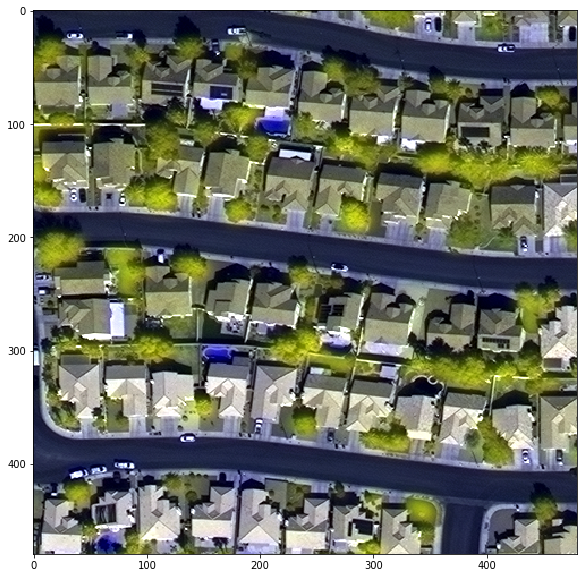

In [101]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(scale_bands(X_scaled[:, :, [6,7,0]]))


In [102]:
#Should take in X_new because it has the prediction as Ch.8
def split_and_resize(array_to_split, number_of_arrays):
    split_num = sqrt(number_of_arrays)
    
    #X_arrays
    new_X_arrays = []
    X_scaled_1,X_scaled_2 =  np.array_split(array_to_split,split_num,axis=1)    
    X_scaled_1a, X_scaled_1b = np.array_split(X_scaled_1,split_num,axis=0)
    new_X_arrays.append(X_scaled_1a)
    new_X_arrays.append(X_scaled_1b)
    X_scaled_2a, X_scaled_2b = np.array_split(X_scaled_2,split_num,axis=0)
    new_X_arrays.append(X_scaled_2a)
    new_X_arrays.append(X_scaled_2b)
    new_X_arrays_large = []
    for piece in new_X_arrays:
        size = piece.shape[1]
        larger_piece = resize(piece, (2*size, 2*size))
        new_X_arrays_large.append(larger_piece)
    #Pred_arrays
    #Pred = X_new[:,:,8]
    #Pred_scaled_1,Pred_scaled_2 =  np.array_split(array_mask,split_num,axis=1)    
    #Pred_scaled_1a, Pred_scaled_1b = np.array_split(array_mask,split_num,axis=0)

    #new_arrays.append([X_scaled_1a, X_scaled_1b,X_scaled_2a, X_scaled_2b])

    return new_X_arrays, new_X_arrays_large

In [103]:
new_arrays, new_arrays_large = split_and_resize(X_new, 4)

In [104]:
len(new_arrays)

4

In [105]:
new_arrays[1].shape

(240, 240, 9)

In [106]:
new_arrays_large[1].shape

(480, 480, 9)

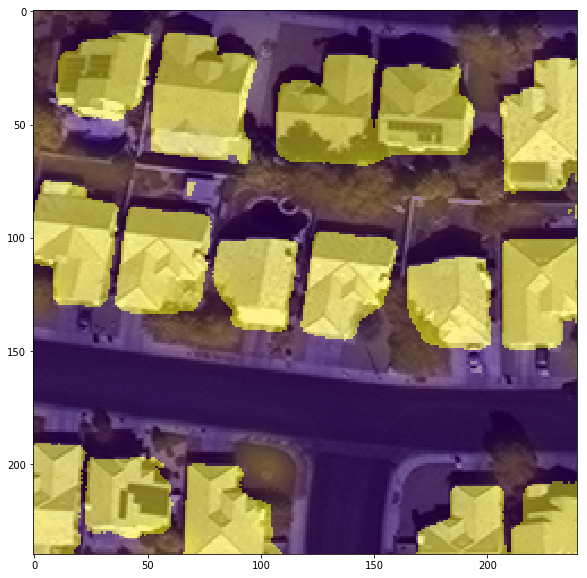

In [113]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(scale_bands(new_arrays[3][:, :, [6,7,0]]))
ax.imshow(new_arrays[3][:,:,8], alpha=0.5)

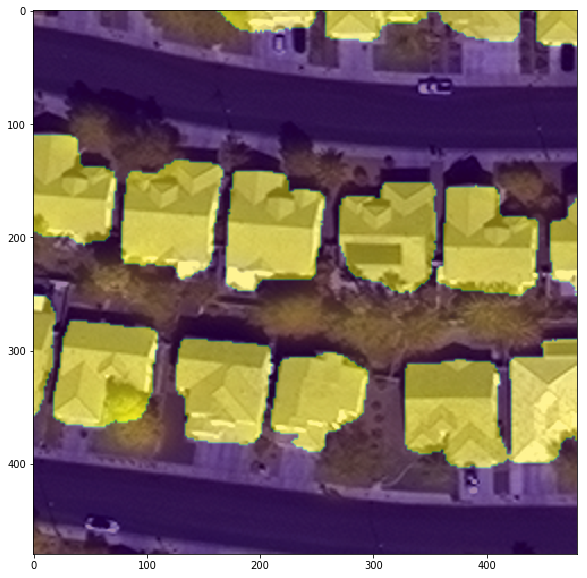

In [108]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(scale_bands(new_arrays_large[2][:, :, [6,7,0]]))
ax.imshow(new_arrays_large[2][:,:,8], alpha=0.5)

In [115]:
X_train[1].shape

(480, 480, 8)